# Better Plots 

## The theory of good visuals

There is an enormous amount of scholarship and debate about what makes for _**effective**_ graphs and I can't possibly do the field justice. Below is simply one person's distillation of some tips that are reasonably well agreed upon. I'm aiming for concise here so that we can practice, but if you want more, visit the links below. 

```{admonition} [Don'ts](https://www.biostat.wisc.edu/~kbroman/presentations/IowaState2013/graphs_combined.pdf)
:class: warning 

- pie charts: humans stink at interpreting angles
- stacked bar charts: tough to decode trends 
- make your reader do math: if $x-y$ is interesting, don't plot $x$ and $y$ separately, just plot $x-y$
- misleading scales
- 3D unless absolutely necessary (and it almost surely isn't)
- distracting chart junk
- unnecessary colors
- spaghetti charts: too many lines
    - [the "sparkline" on pg. 221 here is a great solution](https://pubs.aeaweb.org/doi/pdf/10.1257/jep.28.1.209)
    
![](https://media.giphy.com/media/pi1u9o9M436Lu/giphy.gif)
    
```



```{admonition} [Do's: slides 49-64](https://www.biostat.wisc.edu/~kbroman/presentations/IowaState2013/graphs_combined.pdf)
:class: tip

- Show the data, reduce the clutter, and integrate the text and the graph
    - graphs should aspire to be sufficient to understand without reading the text
- Control the aspect ratio 
- Think about whether you need to include zero. Sometimes excluding it makes the figure misleading. Sometimes including it (and expanding the y-axis to do so) hides the variation you're describing. 
- Facilitate comparisons:
    - by placing figure components next to or above (depends!) the stuff it is compared to
    - by using the same axis (two y-axes is usually bad!)
    - **labels >  legends! (so readers eyes don't have to dart back and forth)**
    - **sort in meaningful orders (i.e. not alphabetically!)**
```


## Transforming bad figures to good ones

![](https://stat545.com/img/less-is-more-darkhorse-analytics.gif)

- [Tell a story](https://serialmentor.com/dataviz/telling-a-story.html)
- [Look at the before/after examples here.](https://pubs.aeaweb.org/doi/pdf/10.1257/jep.28.1.209) **This article is also wonderful for understanding the "why"s of good data viz**

## Customizing figure aspects

1. Create your plot in pandas or seaborn
2. Format the figure as much as possible from *within* the pandas or seaborn function. I have some info on that below. 
3. If/when necessary, use `matplotlib` to customize the figure.  

```{admonition} After you create a figure object, subsequent calls to that object will modify it
:class: tip 
Copy this code below into a python file and run it. Then uncomment out the next line, and rerun. See the change it made. Then uncomment the next line, rerun, and so on. 
```

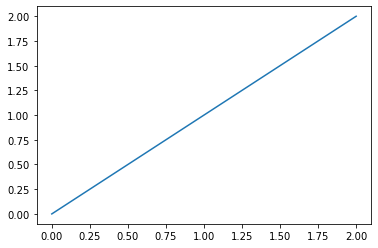

In [1]:
### THIS IS A SILLY ILLUSTRATION! LOOK AT THE DROP DOWNS BELOW, AND 
### THE EXAMPLES THROUGHOUT, FOR MORE REALISTIC SET UPS FOR HOW
### WE MODIFY PLOTS FROM PANDAS/SEABORN FUNCTIONS

import matplotlib.pyplot as plt
import numpy as np

x = np.linspace(0, 2, 100)

plt.plot(x, x, label='linear')       # creates plt obj
# plt.plot(x, x**2, label='quadratic') # adds another plot on top
# plt.plot(x, x**3, label='cubic')     # again

# plt.xlabel('x label')
# plt.ylabel('y label')
# plt.title("Simple Plot")

# plt.legend()

# plt.show()

```{warning}
That example above is just to illustrate how we modify figure objects. In practice, I doubt you will ever plot with the `plt.plot()` function. 

Since, you'll use pandas and seaborn, when you modify figure objects, you'll usually be modifying objects you name `fig` or `ax` (or similar, like `f1`, `f2`, etc...)

```

```{dropdown} Formatting plots in pandas

1. Optional: Set up the size of your overall figure and create `fig` and `ax` objects so you can manipulate the figures:  `fig, ax = plt.subplots(figsize=(width in inches,height))`. 
    - Advanced use: If you are **manually** creating subfigures, use `fig, ax = plt.subplots(#,#,figsize=(width in inches,height))` to tell it how many rows and columns of subfigures to set up.
2. `ax = <plot commands>`, e.g. `ax = df.plot()`
3. The pandas plot function can set your title and change many elements as arguments. [See the documentation.](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html) 
    - Ex: `ax = df.plot(title="My Title")`
3. Modify the figure by accessing the `fig` and `ax` commands as needed.

```

```{dropdown} Formatting plots in seaborn

1. Optional: Set up the size of your overall figure and create `fig` and `ax` objects so you can manipulate the figures:  `fig, ax = plt.subplots(figsize=(width in inches,height))`. 
    - Advanced use: If you are **manually** creating subfigures, use `fig, ax = plt.subplots(#,#,figsize=(width in inches,height))` to tell it how many rows and columns of subfigures to set up.
2. `ax = <plot commands>`, e.g. `ax = sns.lineplot(data=df,x='x',y='y')`
    - Alt: Assign the plot to ax within the function, e.g. `sns.lineplot(data=df,x='x',y='y',ax=ax)`
3. You can frequently modify `sns` plots with a method chain, e.g. `sns.lineplot(data=df,x='x',y='y').set(title="My Title",xlabel="X")`
3. Modify the figure by accessing the `fig` and `ax` commands as needed.

```

For changes outside the `pd` and `sns` plot functions: Honestly, [I can't do much better than this page.](https://pbpython.com/effective-matplotlib.html)


## Practice: Fixer Upper

Let's say I want to plot the average leverage for firms in different industries before and after the 2008 financial crisis, and I wanted to see how it evolved for HIGH LEVERAGE industries vs. LOW LEVERAGE industries.

The code (hidden) below spits out the raw content. 

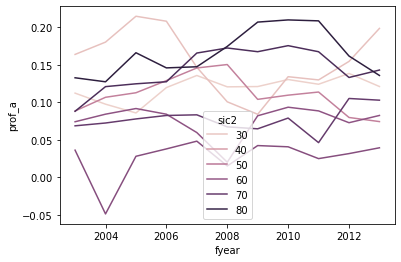

In [2]:
#!pip install plotly
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px # pip install plotly.. the animation below is from plotly module
from io import BytesIO
from zipfile import ZipFile
from urllib.request import urlopen

url = 'https://github.com/LeDataSciFi/ledatascifi-2021/blob/main/data/CCM_cleaned_for_class.zip?raw=true'

#firms = pd.read_stata(url)   <-- would work, but GH said "too big" and forced me to zip it, 
# so here is the work around to download it:

with urlopen(url) as request:
    data = BytesIO(request.read())

with ZipFile(data) as archive:
    with archive.open(archive.namelist()[0]) as stata:
        ccm = pd.read_stata(stata)

# get industry-avg leverage (for each year)        
# I use 2 digit SIC codes here to define an industry

ccm['sic3'] = pd.to_numeric(ccm['sic3'], errors='coerce')

sic2_year = (ccm
    .assign(sic2 = ccm['sic3']//10) 
    .query('fyear >= 2003 & fyear <= 2013 & sic2 != 99 & sic2 != 41')
    .groupby(['sic2','fyear'])
    [['td_a','prof_a']].mean()
)

# reduce to hi/lo lev industrys 

lo4 = sic2_year.query('fyear == 2007')['td_a'].sort_values().reset_index()['sic2'][:4].to_list()
hi4 = sic2_year.query('fyear == 2007')['td_a'].sort_values().reset_index()['sic2'][-4:].to_list()
inds_to_examine = lo4.copy()
inds_to_examine.extend(hi4)

# add industry labels to dataset

sic2_labels = pd.DataFrame({
    'sic2': [82.0, 31.0, 63.0, 47.0, 70.0, 27.0, 75.0, 61.0], 
    'sic2_ind': ['Educational Services','Leather Products','Insurance Carriers','Transportation Services',
                 'Hotels','Printing & Publishing','Auto Repairs','Nondepository Institutions']})
sic2_year = sic2_year.reset_index().merge(sic2_labels,on='sic2')

# add hi/lo industry leverage variable

sic2_year['Group'] = 'High Lev Industries'
sic2_year.loc[ sic2_year['sic2'].isin(lo4), 'Group'] = 'Low Lev Industries'

ax = sns.lineplot(data = sic2_year, x = 'fyear', y='prof_a', hue='sic2')


**BUT WOW IS THIS UGLY AND ALMOST USELESS**
1. Which series is which industry? (color scales mean nothing here)
2. Which series are the high leverage industries? Which are low?
3. Bad axis titles
4. The legend is on top of the data    
5. OMG: The legend is showing **the wrong industry numbers** (it should be include 47, 31, 82, ...)

![](https://media.giphy.com/media/6BHo4gLh9rqtW/giphy.gif)

Let's take a first pass at cleaning this up:
- `relplot` + `kind="line"` = same graph
- `relplot` + `kind="line"` + `col='Group'` = facets for high/low lev industries
- remove the legend, we will add text labels later
- Set the title, facet titles, axis titles (a little trickier because of the facts)

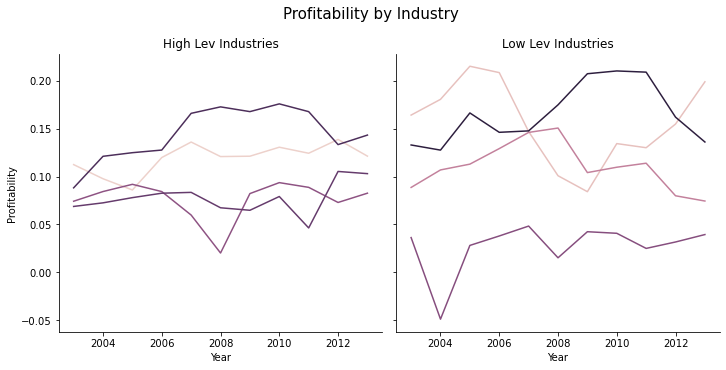

In [3]:

g = sns.relplot(data = sic2_year, x = 'fyear', y='prof_a', 
                hue='sic2', kind='line', col='Group',
                legend=False)
g.fig.suptitle('Profitability by Industry', fontsize=15, )
g.fig.subplots_adjust(top=0.85) # Reduce plot to make room 
g.set_axis_labels("Year", "Profitability")
g.axes[0][0].set_title('High Lev Industries')
g.axes[0][1].set_title('Low Lev Industries')
print()

Now we just need to add labels so we know what lines are which industries:

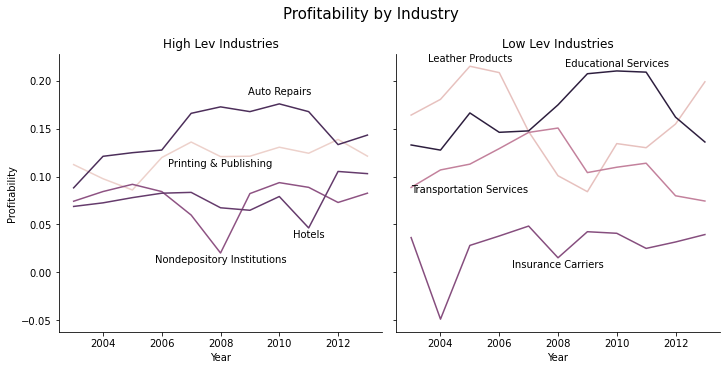

In [4]:
# remake the graph

g = sns.relplot(data = sic2_year, x = 'fyear', y='prof_a', 
                hue='sic2', kind='line', col='Group',
                legend=False)
g.fig.suptitle('Profitability by Industry', fontsize=15, )
g.fig.subplots_adjust(top=0.85) # Reduce plot to make room 
g.set_axis_labels("Year", "Profitability")
g.axes[0][0].set_title('High Lev Industries')
g.axes[0][1].set_title('Low Lev Industries')

# now set up the labels to replace the legend - I'm going for "excellent"

# I'll put the labels on these data points

ind_year_for_labels = '(fyear == 2008 & sic2 == 61) | (fyear == 2011 & sic2 == 70) | (fyear == 2010 & sic2 == 75) |' + \
                      '(fyear == 2008 & sic2 == 27) | (fyear == 2010 & sic2 == 82) | (fyear == 2005 & sic2 == 31) |' + \
                      '(fyear == 2008 & sic2 == 63) | (fyear == 2005 & sic2 == 47)'

# and each one will be higher or lower than it's data point by 
# some amount so that text doesnt cover the lines

sic2_year['y_offset'] = -.01
sic2_year.loc[ sic2_year['sic2'] == 75, 'y_offset'] = .01 # autorepairs
sic2_year.loc[ sic2_year['sic2'] == 47, 'y_offset'] = -.03 # trans
sic2_year.loc[ sic2_year['sic2'] == 31, 'y_offset'] = .005 # leather
sic2_year.loc[ sic2_year['sic2'] == 82, 'y_offset'] = .005 # edu

# this funct will add the text to a subfigure

def label_point(df, x, y, val, ax, y_offset):
    for i, point in df.iterrows():
        ax.text(point[x], point[y]+point[y_offset], str(point[val]),horizontalalignment='center')

# add the labels to the graph

high_sub = sic2_year.query('Group == "High Lev Industries" & ('+ind_year_for_labels+')')
label_point(high_sub,'fyear','prof_a','sic2_ind', g.axes[0][0],'y_offset')  

high_sub = sic2_year.query('Group == "Low Lev Industries" & ('+ind_year_for_labels+')')
label_point(high_sub,'fyear','prof_a','sic2_ind', g.axes[0][1],'y_offset')  


## Practice: Thinking and planning

**Questions:** 

1. Suppose we create a scatter plot but find that due to the large number of points it's hard to interpret. What are two things we can do to fix this issue?
2. Suppose that we create an n-by-n FacetGrid. How big can "n" get?
3.  What are the two things about faceting which make it appealing?
4.  When is `sns.pairplot` most useful?


**Answers**

```{dropdown} Q1
One way to fix this issue would be to sample the points. Another way to fix it would be to use a hex plot.
```
```{dropdown} Q2
A matter of size and visibility, but 5x5 is probably as large as you want to go. 
```
```{dropdown} Q3
It's a easy way to show info about additional variables of interest to a figure.
```
```{dropdown} Q4
Especially useful when you're exploring the dataset.
```


## Interactive plots: `plotly`

I want to show you how far we can push this exploration of leverage and firm value. The code uses `plotly`'s subpackage `plotly-express` which is ridiculously easy to use, for how cool these plots are. 

And as an exercise, you might critique these - I certainly think there are aspects to improve!


In [5]:
#!pip install plotly
%matplotlib inline
import pandas as pd
import numpy as np
import plotly.express as px # pip install plotly.. the animation below is from plotly module
from io import BytesIO
from zipfile import ZipFile
from urllib.request import urlopen

url = 'https://github.com/LeDataSciFi/ledatascifi-2021/blob/main/data/CCM_cleaned_for_class.zip?raw=true'

#firms = pd.read_stata(url)   <-- would work, but GH said "too big" and forced me to zip it, 
# so here is the work around to download it:

with urlopen(url) as request:
    data = BytesIO(request.read())

with ZipFile(data) as archive:
    with archive.open(archive.namelist()[0]) as stata:
        firms = pd.read_stata(stata)

# firms = pd.read_stata('https://github.com/LeDataSciFi/ledatascifi-2021/blob/main/data/CCM_cleaned_for_class.zip?raw=true')
firms.name = "Firms"

In [6]:
# https://jupyterbook.org/guide/05_faq.html#How-can-I-include-interactive-Plotly-figures?

# the lines before and after the fig help make sure this is viewable on the website 
# but shouldn't be necessary just for notebook viewing... but I'm not sure about github viewing

from IPython.core.display import display, HTML
from plotly.offline import init_notebook_mode, plot
init_notebook_mode(connected=True)

fig =   (
        firms
            .query('(fyear < 2014) & (mb < 5) & (td_a >= 0) & (td_a < 1.5) ')         # some sensible limits
            .groupby(['state','gsector','fyear'])
            .agg({'td_a':'mean','mb':'mean','at':'sum','lpermno':'count'
                 }) # we need the # of firms per industry-state for an extra filter
                    # and I wanted the total assets summed so bigger industries get bigger circles
            .rename(columns={'td_a':'Avg Book Leverage', 'mb':'Avg Market to Book','lpermno':'Num_Firms'})     
            .query('Num_Firms > 20 ')    # disgard small industry-states
            .reset_index() # get fyear as a variable for plotting function
            .pipe( 
                 (px.scatter,'data_frame'), 
                  y='Avg Market to Book', x='Avg Book Leverage', animation_frame="fyear", 
                  range_x=[0,.5], range_y=[0,2], hover_data=["state","gsector"],
                  title = "State-By-Industry Avg Leverage and Avg Firm Value"
            )
        )
    
plot(fig, filename = 'ind-state mb vs lev.html')
display(HTML('ind-state mb vs lev.html'))


In [7]:
fig =   (
            firms
                .query('(fyear < 2014) & (mb < 5) & (td_a >= 0) & (td_a < 1.5) ')         # some sensible limits
                .query('state in ["CA","NY"] & gsector in ["40","45"]')  # sample restriction
                .rename(columns={'td_a':'Book Leverage'})    
                .reset_index() # get fyear as a variable for plotting function
                .pipe( 
                     (px.scatter,'data_frame'), 
                      y='mb',x='Book Leverage',animation_frame="fyear",
                      range_x=[0,1.5], range_y=[0,5], 
                      facet_row="gsector", facet_col="state",
                      hover_data=["state","gsector"],
                      title = "Leverage and Firm Value"
                )
        )
plot(fig, filename = 'mb vs lev for each state-ind.html')
display(HTML('mb vs lev for each state-ind.html'))


**One more:** This is a replication of a famous Hans Rosling TED talk figure using the well-known gapminder data:


In [8]:
fig = px.scatter(px.data.gapminder(), x="gdpPercap", y="lifeExp",
                    size="pop", color="continent",animation_frame="year",
                     range_y=[30,85],              
                    hover_name="country", log_x=True, size_max=60)
plot(fig, filename = 'hans.html')
display(HTML('hans.html'))
